In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.stats import pearsonr
from scipy.spatial.distance import cdist
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm


from scipy.spatial.distance import pdist, squareform
from collections import defaultdict

sc.settings.verbosity = 2

# Load in processed anndata

In [2]:
%%time
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups.h5ad"
adata = sc.read_h5ad(path)
sc.logging.print_memory_usage()
adata

Memory usage: current 2.37 GB, difference +2.37 GB
CPU times: user 267 ms, sys: 1.58 s, total: 1.84 s
Wall time: 4.93 s


/home/jrcwycy/miniconda3/envs/rapids/lib/python3.13/site-packages/anndata/logging.py:57: FutureWarning: The specified parameters ('newline',) are no longer positional. Please specify them like `newline=False`
  print(format_memory_usage(get_memory_usage(), msg, newline))


AnnData object with n_obs × n_vars = 15950 × 25042
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'means', 'variance

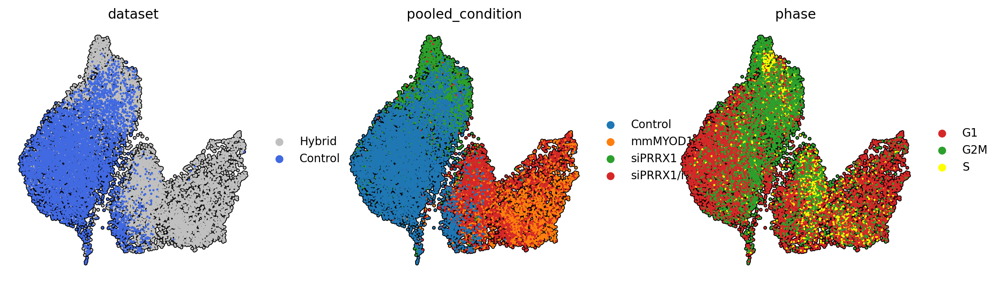

In [3]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['dataset', 'pooled_condition', 'phase'],
    size=15,
    ncols=3,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

condition_by_phase_group
Control_G1/S            3770
mmMYOD1_G1/S            1733
siPRRX1_G1/S            1936
siPRRX1/mmMYOD1_G1/S    2415
Control_G2/M            3190
mmMYOD1_G2/M             376
siPRRX1_G2/M            1494
siPRRX1/mmMYOD1_G2/M    1036
Name: count, dtype: int64


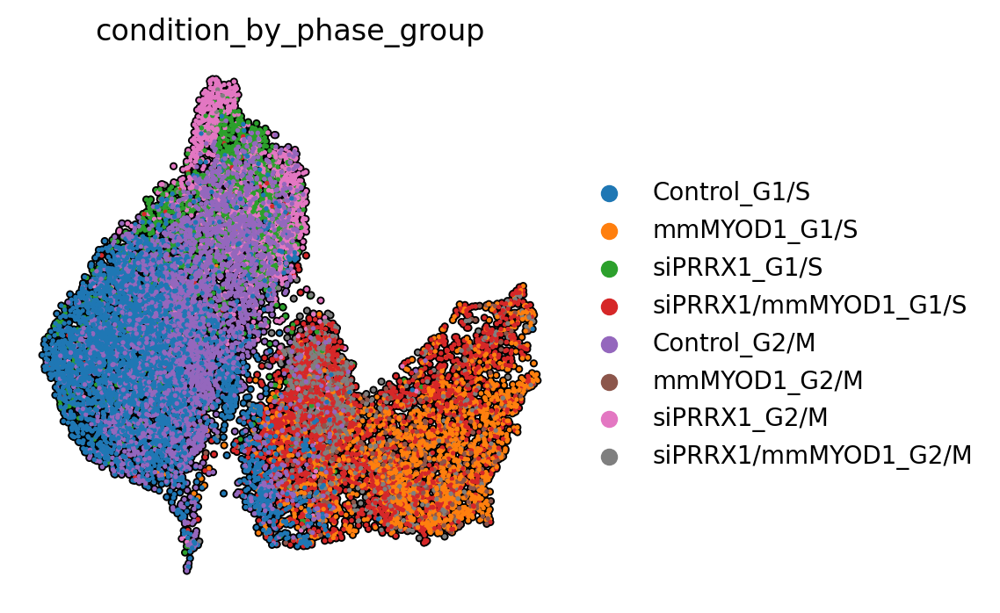

In [4]:
phase_group_map = {
    "G1": "G1/S",
    "S": "G1/S",
    "G2M": "G2/M"
}

adata.obs["condition_by_phase_group"] = (
    adata.obs["pooled_condition"].astype(str) + "_" +
    adata.obs["phase"].map(phase_group_map)
)

# Make categorical and optionally order
conditions = ["Control", "mmMYOD1", "siPRRX1", "siPRRX1/mmMYOD1"]
phase_groups = ["G1/S", "G2/M"]
ordered_categories = [f"{cond}_{ph}" for ph in phase_groups for cond in conditions]

adata.obs["condition_by_phase_group"] = pd.Categorical(
    adata.obs["condition_by_phase_group"],
    categories=ordered_categories,
    ordered=True
)

print(adata.obs["condition_by_phase_group"].value_counts(sort=False))

sc.pl.umap(
    adata,
    color=['condition_by_phase_group'],
    size=15,
    # ncols=3,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

# Quiescence genes

In [5]:
fpath = "../../resources/genes_for_scoring.csv"

df = pd.read_csv(fpath)
print(df.shape)
print(df.columns.tolist())
df.head()

(512, 18)
['G1/S_transition', 'G2/M_transition', 'CC_checkpoints', 'Cell_cycle_reg', 'Pos_proliferation', 'Neg_proliferation', 'quiescence', 'AS', 'Chromatin', 'Circadian', 'Core_repro', 'NOTCH_signaling', 'Asymm_PCP', 'FOXO', 'p53_acyivity', 'DREAM/negE2F', 'senes_stress', 'sasp']


,G1/S_transition,G2/M_transition,CC_checkpoints,Cell_cycle_reg,Pos_proliferation,Neg_proliferation,quiescence,AS,Chromatin,Circadian,Core_repro,NOTCH_signaling,Asymm_PCP,FOXO,p53_acyivity,DREAM/negE2F,senes_stress,sasp
0,FBXW7,CDC25A,CHFR,YTHDF2,EMP2,IGFBP5,ATF3,CWC27,H2AJ,TEF,HDAC9,FBXW7,SMURF2,TXN,MAPK11,CDC25A,H2AZ2,H2AZ2
1,CCNP,CDK6,CDK1,PRKCA,TNXB,ZBTB7C,ATF4,DDX20,HCFC1,SFPQ,POLR2C,ST3GAL4,SMURF1,PLXNA4,TPX2,CDK1,ACD,H2BC9
2,EZH2,NES,MRNIP,OBSL1,CX3CL1,NTRK1,CTNNB1,RBM3,INO80E,THRAP3,PTN,FCER2,WNT5A,SOD2,TAF9B,E2F1,H2BC9,JUN
3,APBB1,CDK1,DGKZ,LOC102724428,CCND2,KDF1,BACH2,RBM5,HDAC8,NKX2-1,JUN,PSMA7,SCRIB,KAT2B,DYRK2,LIN52,H2BC4,UBE2C
4,DDX3X,FBXL15,BARD1,MAGEA4,LIG4,BTG3,JUN,RBM23,BAZ2A,LOC102724428,MED31,TBL1X,PSMC6,IGFBP1,MDM4,RBL1,H2BC5,H2BC4


59
computing score 'quiescence_score'
    finished (0:00:01)


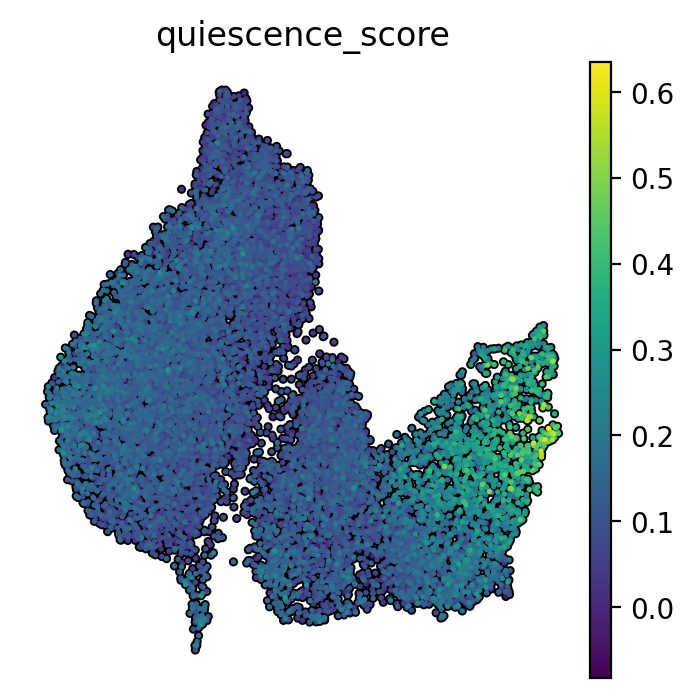

In [6]:
qui_genes = [gene for gene in df['quiescence'].unique() if gene in adata.var_names]
print(len(qui_genes))

sc.tl.score_genes(
    adata,
    gene_list=qui_genes,
    score_name='quiescence_score',
    ctrl_size=500,
    use_raw=False,
    layer='log_norm',
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=['quiescence_score'],
    size=15,
    ncols=1,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

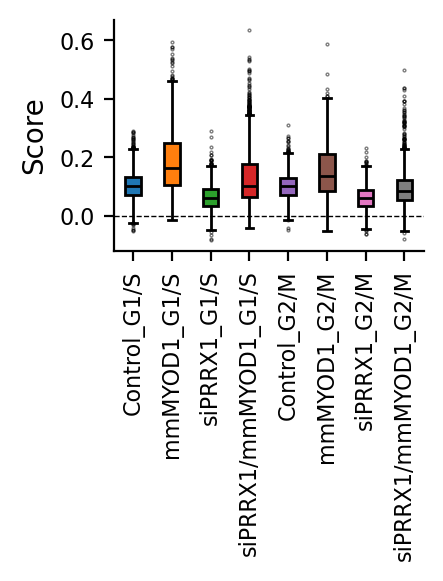

In [8]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2, 1.5

sns.boxplot(
    data=adata.obs,
    # x='pooled_condition',
    # hue='pooled_condition',
    x='condition_by_phase_group',
    hue='condition_by_phase_group',
    y='quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    # palette=colors,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show() 

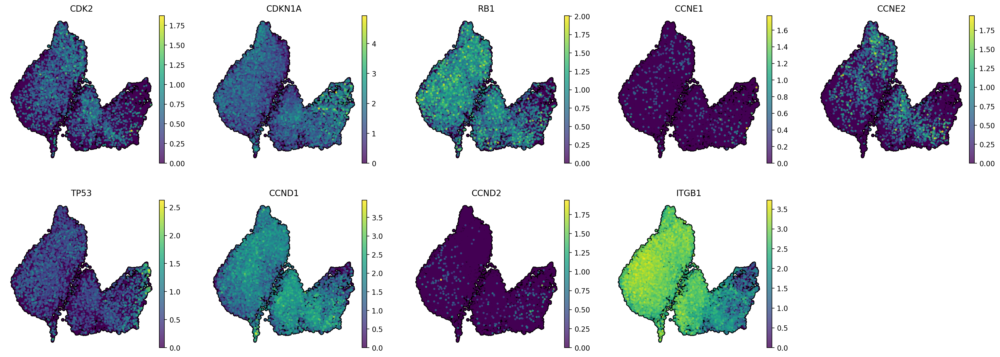

In [9]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

genes_to_plot = ['CDK2', 'CDKN1A', 'RB1', 'CCNE1', 'CCNE2',
                 'TP53', 'CCND1', 'CCND2', 'ITGB1'
                ]

sc.pl.umap(
    adata,
    color=genes_to_plot,
    ncols=5,
    size=35,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False, 
    alpha=0.8,
    layer='log_norm',
)

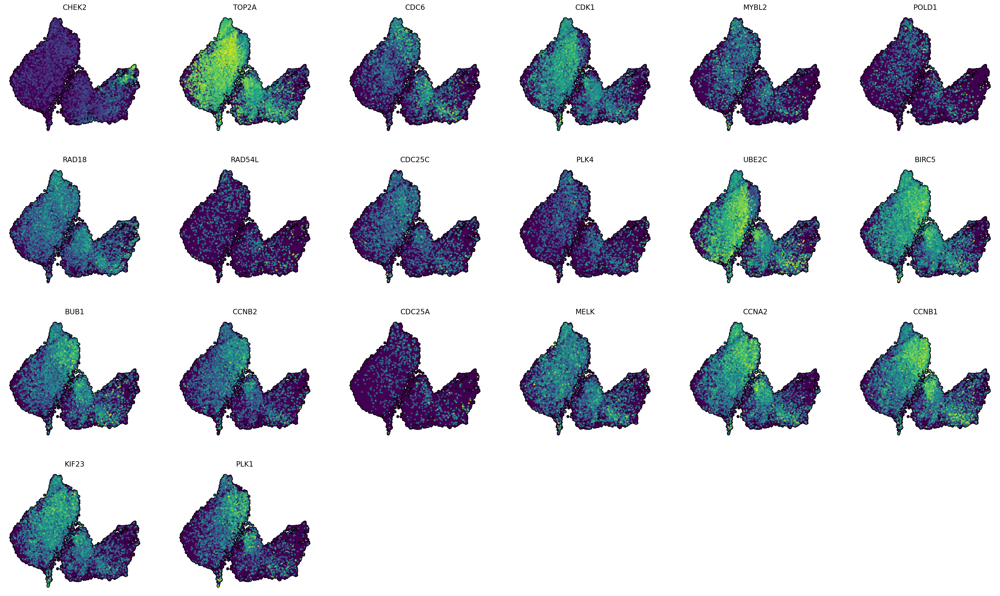

In [167]:
genes_to_plot = [
    # DREAM target genes
    'CHEK2', 'TOP2A', 'CDC6', 'CDK1', 'MYBL2', 'POLD1', 'RAD18', 'RAD54L', 'CDC25C',
    'PLK4', 'UBE2C', 'BIRC5', 'BUB1', 'CCNB2', 'CDC25A', 'MELK', 'CCNA2', 'CCNB1', 'KIF23', 'PLK1'
]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    color=genes_to_plot,
    ncols=6,
    size=35,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False, 
    alpha=0.8,
    layer='log_norm',
    colorbar_loc=None,
)

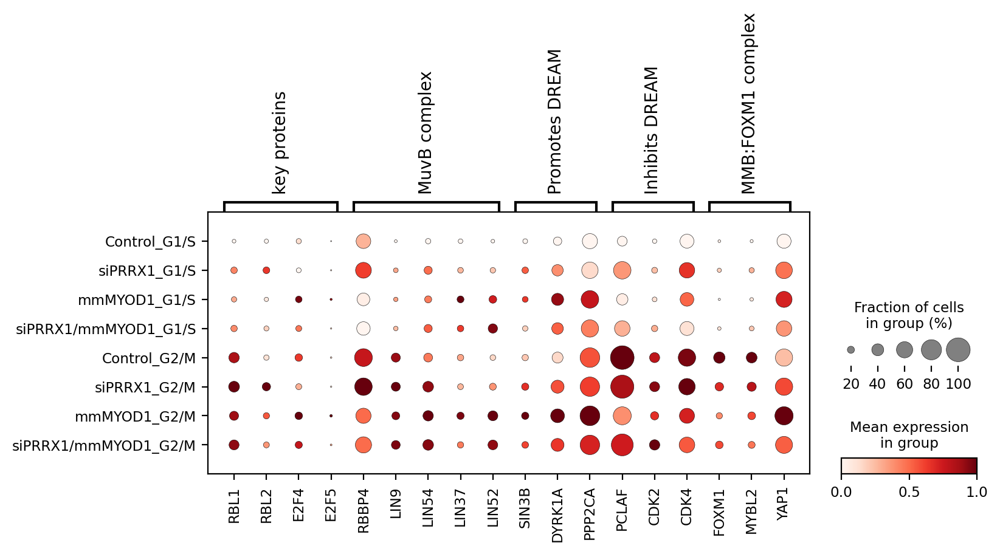

In [179]:
genes = {
    'key proteins': ['RBL1', 'RBL2', 'E2F4', 'E2F5'], # key proteins
    'MuvB complex': ['RBBP4', 'LIN9', 'LIN54', 'LIN37', 'LIN52'], # MuvB complex
    'Promotes DREAM': ['SIN3B', 'DYRK1A', 'PPP2CA'], # promotes DREAM
    'Inhibits DREAM': ['PCLAF', 'CDK2', 'CDK4'], # inhibits DREAM
    'MMB:FOXM1 complex': ['FOXM1', 'MYBL2', 'YAP1'], # MMB:FOXM1 complex (YAP stimulates MMB formation)
}
    
# genes_to_plot = [gene for gene in genes.items if gene in adata.var_names]

# order = ['Control_G1/S', 'Control_G2/M', 'mmMYOD1_G1/S', 'mmMYOD1_G2/M', 'siPRRX1_G1/S', 'siPRRX1_G2/M', 'siPRRX1/mmMYOD1_G1/S', 'siPRRX1/mmMYOD1_G2/M']
order = ['Control_G1/S', 'siPRRX1_G1/S', 'mmMYOD1_G1/S', 'siPRRX1/mmMYOD1_G1/S', 'Control_G2/M', 'siPRRX1_G2/M', 'mmMYOD1_G2/M', 'siPRRX1/mmMYOD1_G2/M']

sc.pl.dotplot(
    adata,
    groupby='condition_by_phase_group',
    var_names=genes,
    layer='log_norm',
    # title=pathway,
    standard_scale='var',
    categories_order=order,
)